In [32]:
#This script will take a raw numpy array generated by exporting the ROI output from Sima, and align all the trials
#together for each cell in the order that they were presented.  This output is then saved to a two new numpy arrays
#called CSplustrials and CSminustrials.

#you can then plot the output of any ROI aligned to the trial time or plot the mean of the cell.  

In [52]:
#load dependents - 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import mpld3
mpld3.enable_notebook()
import pandas as pd
from pandas import Series, DataFrame, groupby, Panel
from seaborn import FacetGrid 

In [91]:
#choose the directory of the data
%cd ~/DATA/P3 D11

/Users/jimotis/DATA/P3 D11


In [92]:
#load the original numpy array that was extracted from SIMA
#signals = np.load('signals.npy')

signals = np.load('extractedsignals.npy')

In [93]:
#the output of this should be 1,#ROIs, total time samples in file)
signals.shape

(1, 17, 5000)

In [94]:
#change this number for the number of rois you have.  this will be referenced below.
numrois = signals.shape[1]
numtimesamples = 50
numtrials = signals.shape[2]/numtimesamples


In [95]:
#This will make an array to repeat the sequential frame series 
#repeated by your total CS+ and CS- trial number
##generates the array that will assign time values to each individual trial, this is currently set for trials that
#that were 20 seconds in length and collected at 2.5 frames/s. (2.5*20 = 50)

trials = np.arange(0.4,numtimesamples)

In [96]:
#generate the CS order index for the mastersheet loaded from a text file in directory called cstrials.txt,
#it then converts this to a boolean array with True = CS- trials, and False = CS+ trials.
csmaster = np.loadtxt('cstrials.txt')
csmaster = csmaster.astype(bool)

In [97]:
#this generate a new array of zeros with trials on y, time on x, rois on z
align = np.zeros([numtrials,numtimesamples,numrois])
#This will then clear all values to NaN
align[:] = np.NAN

In [98]:
#check the shape of your new array
align.shape

(100, 50, 17)

In [99]:
temp = signals[0,:,:].T
temp.shape

(5000, 17)

In [100]:
#Transposes the array signals, and assigns this to the array temp
#for i in range 0-100, the value of align gets added iteratively to each row (trial) from temp.  Running this will
#fill the align array with trials on y, trial time on x, and ROIs on z.

temp = signals[0,:,:].T
for i in range(0,numtrials):
    align[i,:,:] = temp[numtimesamples*(i):numtimesamples*(i+1),:]

In [101]:
#save the re-arranged data as a numpy array called, 'aligned to trial.npy'.
np.save("aligned to trial",align)

In [102]:
#if you need to re-load your previously saved aligned to trial array, use this.

align = np.load('aligned to trial.npy')

In [103]:
#This generates a new array for your CS+ trials for each roi, it will save the array as csplustrials.npy
csplustrials = align[np.logical_not(csmaster),:,:]
np.save("csplustrials", csplustrials)

In [104]:
csplustrials.shape

(50, 50, 17)

In [105]:
#This generates a new array for your CS- trials for each roi, it will save the array as csminustrials.npy
csminustrials = align[(csmaster),:,:]
np.save("csminustrials", csminustrials)

In [106]:
outputdir = '/Users/jimotis/DATA/P3 D11'

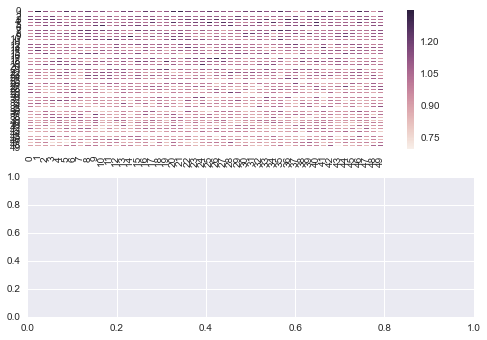

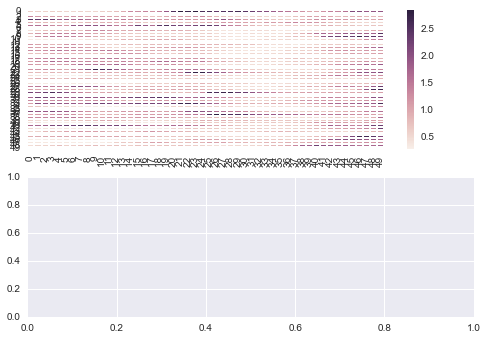

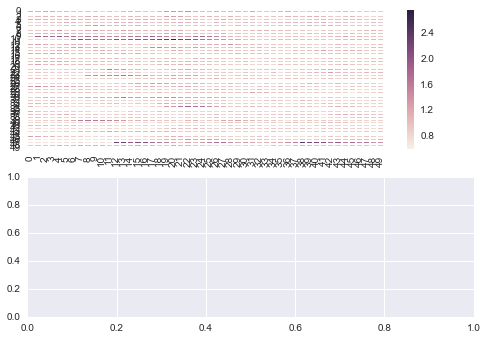

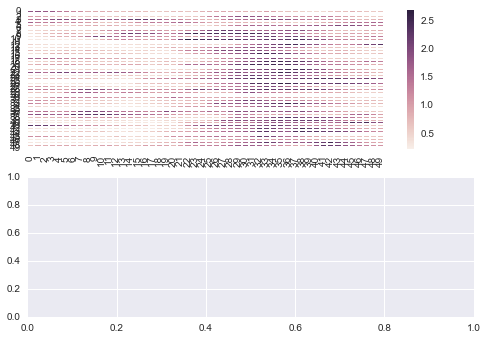

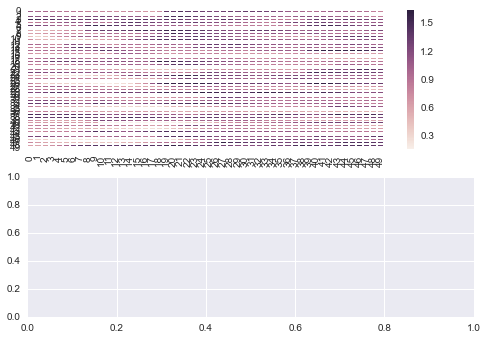

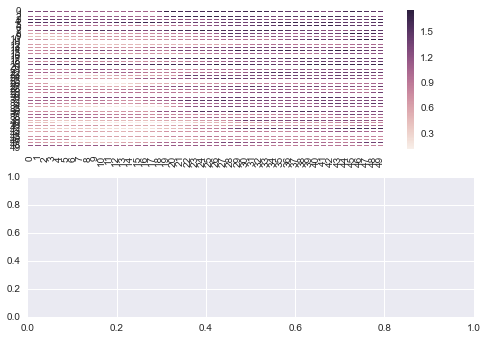

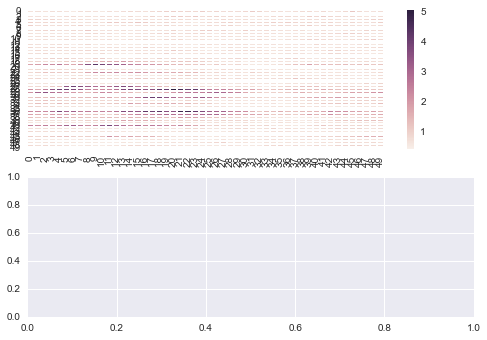

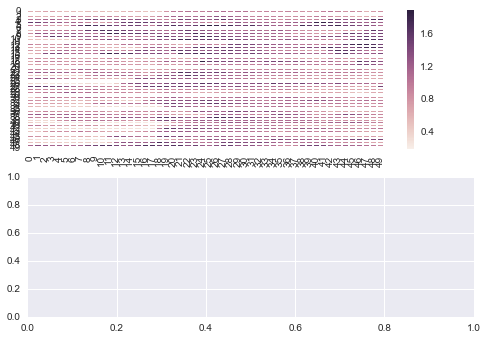

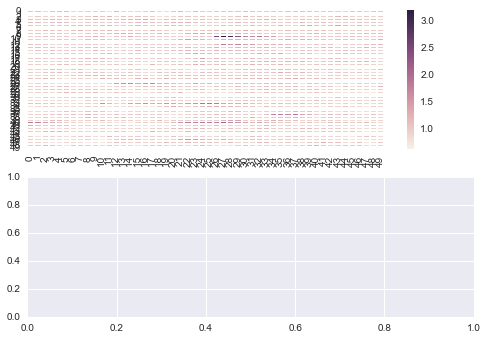

In [50]:
#This generates a heatmap of your CS+ trials on y, time on x, and intensity on z for all rois. You can modify the
# output folder by changing the variable named outputdir below



for i in range(0,numrois):
    f,(ax1,ax2) = plt.subplots(2)
    sns.heatmap(csplustrials[:,:,i],ax=ax1)
    plt.savefig(outputdir+'roi'+str(i)+' CSplus_alltrials.TIF')
    plt.gca().cla()

IOError: [Errno 2] No such file or directory: '/home/stuberlab/Dropbox (Stuber Lab)/Python/2P pavlovian conditioning scripts/roijpegsroi14 CSminus_alltrials.tif'

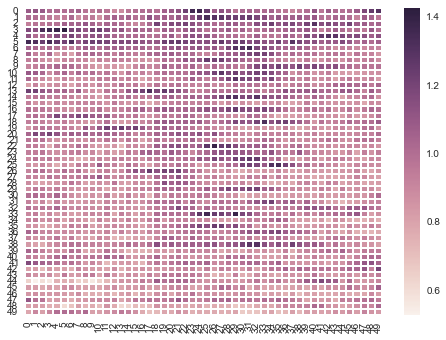

In [25]:
#This generates a heatmap of your CS- trials on y, time on x, and intensity on z. Change the number to select the roi
for i in range(2,numrois):
    sns.heatmap(csminustrials[:,:,i])
    plt.savefig(outputdir+'roi'+str(i)+' CSminus_alltrials.tif')
    plt.gca().cla()   

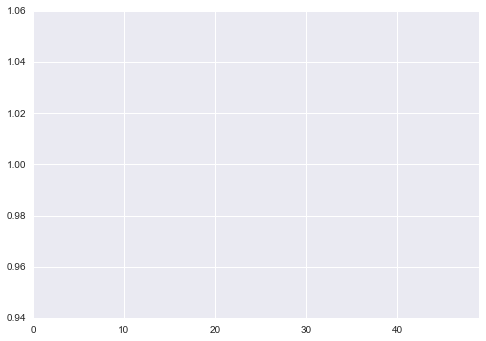

In [29]:
#This plots the signal average for all rois across all the CS+ trials.
for i in range(0,numrois):
    sns.tsplot(csplustrials[:,:,i])
    plt.savefig(outputdir+'roi'+str(i)+' CSplus_average.tif')
    plt.gca().cla()

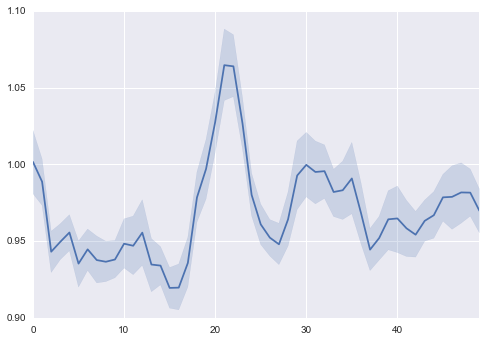

In [46]:
#This plots the signal average for all rois across all the CS- trials.
for i in range(0,numrois):
    sns.tsplot(csminustrials[:,:,i])
    plt.savefig(outputdir+'roi'+str(i)+' CSminus_average.tif')
    plt.gca().cla()

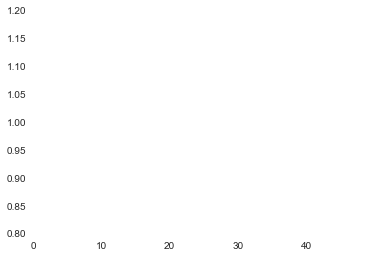

In [107]:
#This plots the signal average for all rois across all the CS trials.
for i in range(0,numrois):
    sns.tsplot(csplustrials[:,:,i],color='red')
    sns.tsplot(csminustrials[:,:,i])
    plt.savefig(outputdir+'roi'+str(i)+' CS_average.tif')
    plt.gca().cla()

In [143]:
import mpld3
mpld3.enable_notebook()